<a href="https://colab.research.google.com/github/meetmehedi/datas/blob/main/Copy_of_NSU_Challenge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

data = pd.read_csv("/content/2013-Now.csv", skiprows=1)

Loading data...
Initial shape: (2570, 22)
Feature engineering...
Numeric features considered: ['latitude', 'longitude', 'depth', 'nst', 'gap', 'dmin', 'rms', 'horizontalError', 'depthError', 'magError', 'magNst', 'hour', 'day', 'month', 'year']
After dropping missing target rows: X shape (2570, 15)
Preprocessing complete. Shapes: (2056, 15) (514, 15)
LinearRegression - MSE: 0.08014994469911499 R2: 0.4228115652579817
RandomForestRegressor - MSE: 0.044068314202334674 R2: 0.682648298864692
XGBRegressor - MSE: 0.04433500846052542 R2: 0.6807277380705746

Regression results:
                   Model       MSE        R2
0       LinearRegression  0.080150  0.422812
1  RandomForestRegressor  0.044068  0.682648
2           XGBRegressor  0.044335  0.680728
Best regression model: RandomForestRegressor


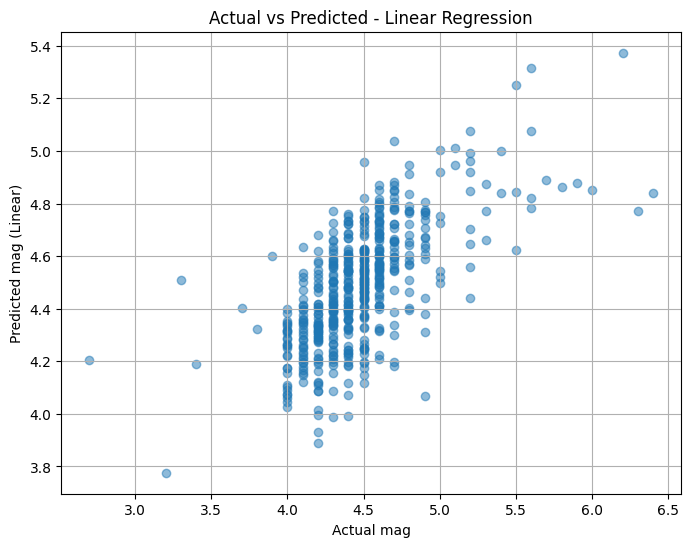

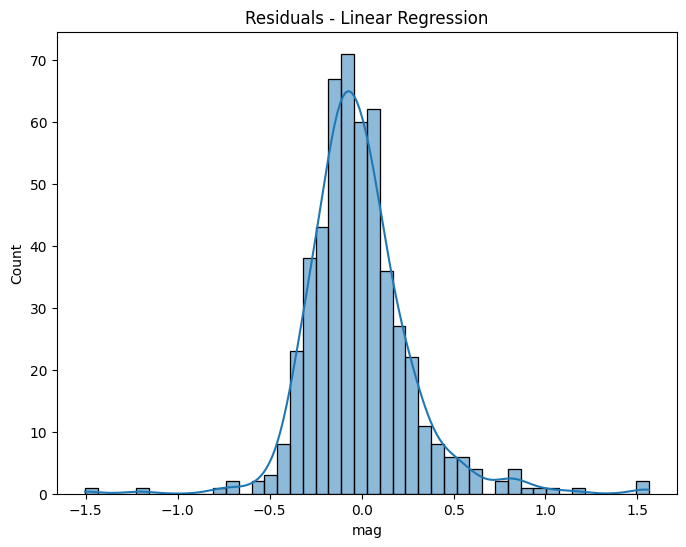

Training class distribution:
 is_strong
0    1875
1     181
Name: count, dtype: int64
After SMOTE, counts: {0: 1875, 1: 1875}

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.87      0.93       477
           1       0.35      0.89      0.51        37

    accuracy                           0.88       514
   macro avg       0.67      0.88      0.72       514
weighted avg       0.94      0.88      0.90       514

ROC AUC: 0.9442461329253782

Random Forest Classifier Report:
              precision    recall  f1-score   support

           0       0.99      0.97      0.98       477
           1       0.67      0.84      0.75        37

    accuracy                           0.96       514
   macro avg       0.83      0.90      0.86       514
weighted avg       0.96      0.96      0.96       514

ROC AUC: 0.9748144370785881

XGBoost Classifier Report:
              precision    recall  f1-score   support

   

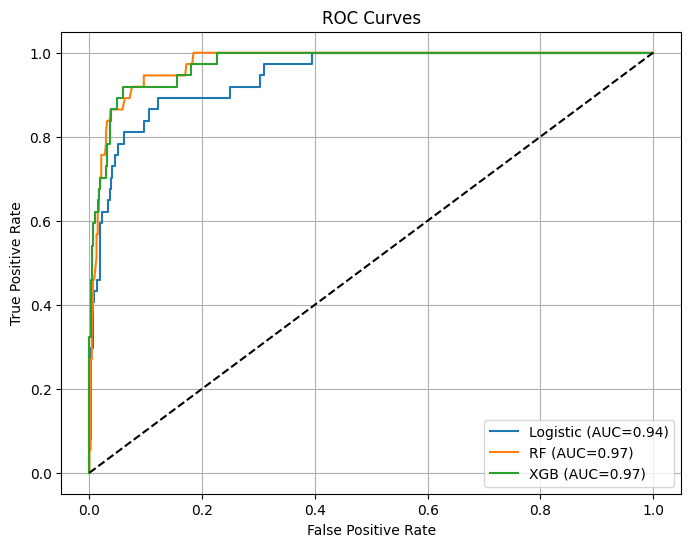

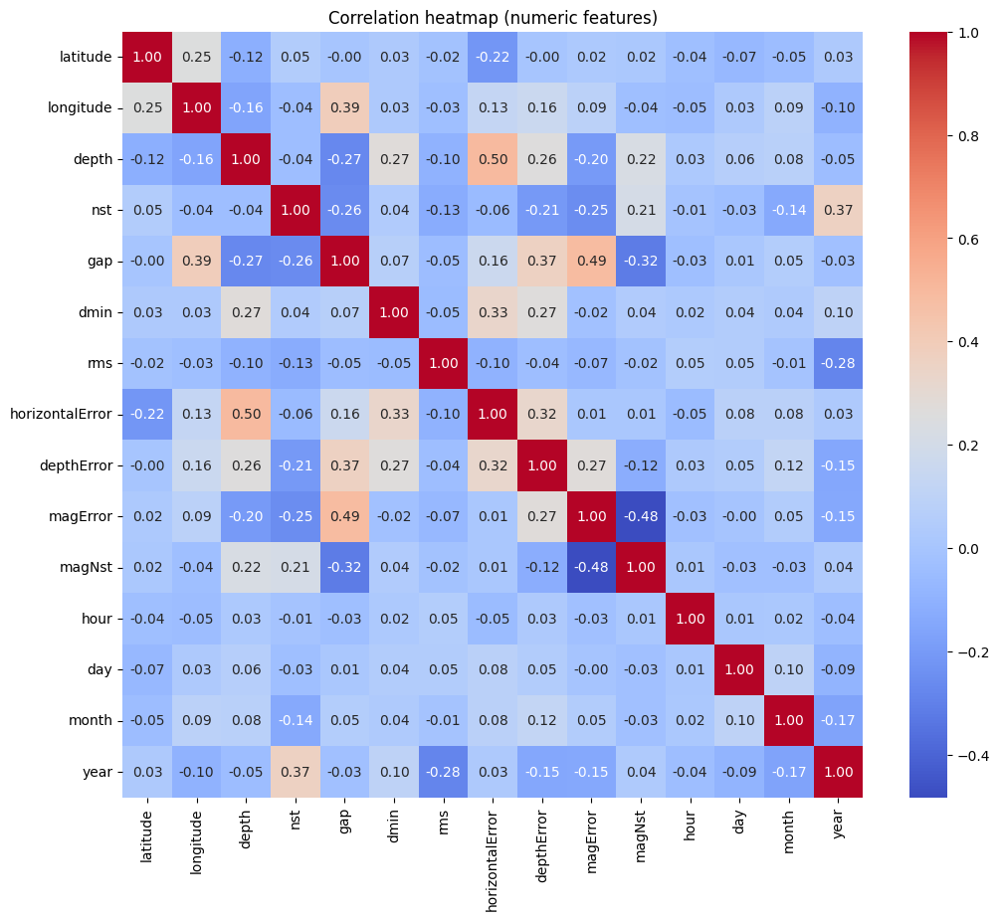

Creating folium map...



All done. Models and artifacts saved to current working directory.


In [44]:
# Refined notebook-style script for Earthquake Regression + Classification
# - Unified preprocessing
# - Feature engineering
# - Regression models (Linear, RandomForest, XGBoost)
# - Classification models (Logistic, RandomForest, XGBoost) with imbalance handling (SMOTE or class_weight)
# - Geospatial visualization (folium)
# - Clear reports and plots

# NOTE: This script is intended to run in Google Colab or a Jupyter notebook.
# If running in a .py file, remove display() and use plt.show() where appropriate.

import os
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_squared_error, r2_score, classification_report, confusion_matrix, roc_auc_score, roc_curve

from sklearn.linear_model import LinearRegression, Ridge, LogisticRegression
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.svm import SVR

import joblib

# Try imports that may need installation in Colab
try:
    import xgboost as xgb
except Exception:
    !pip install xgboost -q
    import xgboost as xgb

try:
    from imblearn.over_sampling import SMOTE
except Exception:
    !pip install -q imbalanced-learn
    from imblearn.over_sampling import SMOTE

try:
    import folium
except Exception:
    !pip install -q folium
    import folium

# -------------------------------
# Parameters / Filepath
# -------------------------------
DATA_PATH = '/content/2013-Now.csv'  # change if needed
TARGET_REG = 'mag'
CLASS_THRESH = 5.0  # threshold to define "strong" earthquakes for classification
RANDOM_STATE = 42
TEST_SIZE = 0.2
MAX_MAP_MARKERS = 5000  # limit markers for folium performance

# -------------------------------
# Utility functions
# -------------------------------

def safe_read_csv(path):
    """Read CSV with some common fallbacks and return pandas DataFrame."""
    if not os.path.exists(path):
        raise FileNotFoundError(f"File not found: {path}")
    # Try with header detection
    try:
        df = pd.read_csv(path)
        # If first row looks like header spelled as columns, keep it
        return df
    except Exception:
        # Try skipping first row (some exports have a stray line)
        df = pd.read_csv(path, skiprows=1)
        return df


def summarize_models(results):
    """Nicely format model results stored in a list of dicts."""
    return pd.DataFrame(results)


# -------------------------------
# Load and basic cleaning
# -------------------------------
print('Loading data...')
data = safe_read_csv(DATA_PATH)
print('Initial shape:', data.shape)

# If file was loaded without proper header (columns present in row 0), try to detect
if list(data.columns)[:6] == ['time', 'latitude', 'longitude', 'depth', 'mag', 'magType']:
    # good
    pass
else:
    # attempt to set column names if file lacks header
    common_cols = ['time','latitude','longitude','depth','mag','magType','nst','gap','dmin','rms','net','id','updated','place','type','horizontalError','depthError','magError','magNst','status','locationSource','magSource']
    if data.shape[1] == len(common_cols):
        data.columns = common_cols

# Make a copy to avoid modifying original
df = data.copy()

# Convert time to datetime when possible
if 'time' in df.columns:
    df['time'] = pd.to_datetime(df['time'], errors='coerce')

# Standardize column names (strip whitespace)
df.columns = [c.strip() for c in df.columns]

# -------------------------------
# Basic feature engineering
# -------------------------------
print('Feature engineering...')
if 'time' in df.columns:
    df['hour'] = df['time'].dt.hour
    df['day'] = df['time'].dt.day
    df['month'] = df['time'].dt.month
    df['year'] = df['time'].dt.year
else:
    # if time not available, create placeholder numeric time features
    df['hour'] = np.nan
    df['day'] = np.nan
    df['month'] = np.nan
    df['year'] = np.nan

# Create classification target
if TARGET_REG not in df.columns:
    raise KeyError(f"Target column '{TARGET_REG}' not found in data columns: {df.columns.tolist()}")

df['is_strong'] = (df[TARGET_REG] >= CLASS_THRESH).astype(int)

# Keep list of numeric features commonly useful
numeric_features = ['latitude','longitude','depth','nst','gap','dmin','rms','horizontalError','depthError','magError','magNst','hour','day','month','year']
# Filter available numeric features
numeric_features = [c for c in numeric_features if c in df.columns]

print('Numeric features considered:', numeric_features)

# -------------------------------
# Handle missing values for common columns
# -------------------------------
# Impute sensible defaults for a few columns
if 'nst' in df.columns:
    df['nst'] = df['nst'].fillna(0)
if 'magNst' in df.columns:
    df['magNst'] = df['magNst'].fillna(0)

# We'll use sklearn SimpleImputer inside pipelines for remaining numeric features

# -------------------------------
# Prepare data for Modeling
# -------------------------------
# Select X for regression and classification (only numeric features for these models)
X = df[numeric_features].copy()
y_reg = df[TARGET_REG].copy()
y_cls = df['is_strong'].copy()

# Drop rows where target (mag) is missing
mask_valid = y_reg.notna()
X = X[mask_valid]
y_reg = y_reg[mask_valid]
y_cls = y_cls[mask_valid]

print('After dropping missing target rows: X shape', X.shape)

# Train/test split (use same split for regression and classification for comparability)
X_train, X_test, y_train_reg, y_test_reg = train_test_split(X, y_reg, test_size=TEST_SIZE, random_state=RANDOM_STATE)
# Map classification y accordingly
y_train_cls = y_cls.loc[y_train_reg.index]
y_test_cls = y_cls.loc[y_test_reg.index]

# -------------------------------
# Preprocessing pipelines
# -------------------------------
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(transformers=[
    ('num', numeric_transformer, numeric_features)
], remainder='drop')

# Fit preprocessor on training data
preprocessor.fit(X_train)
X_train_prep = preprocessor.transform(X_train)
X_test_prep = preprocessor.transform(X_test)

print('Preprocessing complete. Shapes:', X_train_prep.shape, X_test_prep.shape)

# -------------------------------
# Regression models
# -------------------------------
regression_results = []

# 1) Linear Regression
lr = LinearRegression()
lr.fit(X_train_prep, y_train_reg)
y_pred_lr = lr.predict(X_test_prep)
mse_lr = mean_squared_error(y_test_reg, y_pred_lr)
r2_lr = r2_score(y_test_reg, y_pred_lr)
regression_results.append({'Model':'LinearRegression','MSE':mse_lr,'R2':r2_lr})
print('LinearRegression - MSE:', mse_lr, 'R2:', r2_lr)

# 2) Random Forest Regressor
rf = RandomForestRegressor(n_estimators=200, random_state=RANDOM_STATE, n_jobs=-1)
rf.fit(X_train_prep, y_train_reg)
y_pred_rf = rf.predict(X_test_prep)
mse_rf = mean_squared_error(y_test_reg, y_pred_rf)
r2_rf = r2_score(y_test_reg, y_pred_rf)
regression_results.append({'Model':'RandomForestRegressor','MSE':mse_rf,'R2':r2_rf})
print('RandomForestRegressor - MSE:', mse_rf, 'R2:', r2_rf)

# 3) XGBoost Regressor
xgbr = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=200, learning_rate=0.1, random_state=RANDOM_STATE, n_jobs=-1)
try:
    xgbr.fit(X_train_prep, y_train_reg)
    y_pred_xgb = xgbr.predict(X_test_prep)
    mse_xgb = mean_squared_error(y_test_reg, y_pred_xgb)
    r2_xgb = r2_score(y_test_reg, y_pred_xgb)
    regression_results.append({'Model':'XGBRegressor','MSE':mse_xgb,'R2':r2_xgb})
    print('XGBRegressor - MSE:', mse_xgb, 'R2:', r2_xgb)
except Exception as e:
    print('XGBoost regressor failed:', e)

reg_results_df = summarize_models(regression_results)
print('\nRegression results:')
print(reg_results_df)

# Save best regression model (by R2)
best_reg_idx = reg_results_df['R2'].idxmax()
best_reg_model_name = reg_results_df.loc[best_reg_idx,'Model']
print('Best regression model:', best_reg_model_name)

if best_reg_model_name == 'LinearRegression':
    best_reg_model = lr
elif best_reg_model_name == 'RandomForestRegressor':
    best_reg_model = rf
elif best_reg_model_name == 'XGBRegressor':
    best_reg_model = xgbr
else:
    best_reg_model = lr

joblib.dump({'preprocessor': preprocessor, 'model': best_reg_model}, 'best_regression_pipeline.joblib')

# -------------------------------
# Regression diagnostic plots
# -------------------------------
plt.figure(figsize=(8,6))
plt.scatter(y_test_reg, lr.predict(X_test_prep), alpha=0.5)
plt.xlabel('Actual mag')
plt.ylabel('Predicted mag (Linear)')
plt.title('Actual vs Predicted - Linear Regression')
plt.grid(True)
plt.show()

residuals = y_test_reg - lr.predict(X_test_prep)
plt.figure(figsize=(8,6))
sns.histplot(residuals, kde=True)
plt.title('Residuals - Linear Regression')
plt.show()

# -------------------------------
# Classification models
# -------------------------------
clf_results = []

# Handle imbalance: check class distribution
class_counts = y_train_cls.value_counts()
print('Training class distribution:\n', class_counts)

use_smote = True
if use_smote:
    smote = SMOTE(random_state=RANDOM_STATE)
    X_train_bal, y_train_bal = smote.fit_resample(X_train_prep, y_train_cls)
    print('After SMOTE, counts:', pd.Series(y_train_bal).value_counts().to_dict())
else:
    X_train_bal, y_train_bal = X_train_prep, y_train_cls

# 1) Logistic Regression (with balanced class weight if SMOTE not used)
if not use_smote:
    logreg = LogisticRegression(class_weight='balanced', max_iter=1000, random_state=RANDOM_STATE)
    logreg.fit(X_train_prep, y_train_cls)
else:
    logreg = LogisticRegression(max_iter=1000, random_state=RANDOM_STATE)
    logreg.fit(X_train_bal, y_train_bal)

y_pred_log = logreg.predict(X_test_prep)
y_proba_log = logreg.predict_proba(X_test_prep)[:,1]
print('\nLogistic Regression Classification Report:')
print(classification_report(y_test_cls, y_pred_log))
try:
    auc_log = roc_auc_score(y_test_cls, y_proba_log)
except Exception:
    auc_log = np.nan
print('ROC AUC:', auc_log)
clf_results.append({'Model':'LogisticRegression','ROC_AUC':auc_log})

# 2) Random Forest Classifier
rf_clf = RandomForestClassifier(n_estimators=200, random_state=RANDOM_STATE, n_jobs=-1)
rf_clf.fit(X_train_bal, y_train_bal)
y_pred_rf_clf = rf_clf.predict(X_test_prep)
y_proba_rf_clf = rf_clf.predict_proba(X_test_prep)[:,1]
print('\nRandom Forest Classifier Report:')
print(classification_report(y_test_cls, y_pred_rf_clf))
try:
    auc_rf_clf = roc_auc_score(y_test_cls, y_proba_rf_clf)
except Exception:
    auc_rf_clf = np.nan
print('ROC AUC:', auc_rf_clf)
clf_results.append({'Model':'RandomForestClassifier','ROC_AUC':auc_rf_clf})

# 3) XGBoost Classifier
xgb_clf = xgb.XGBClassifier(n_estimators=200, use_label_encoder=False, eval_metric='logloss', random_state=RANDOM_STATE, n_jobs=-1)
xgb_clf.fit(X_train_bal, y_train_bal)
y_pred_xgb_clf = xgb_clf.predict(X_test_prep)
y_proba_xgb_clf = xgb_clf.predict_proba(X_test_prep)[:,1]
print('\nXGBoost Classifier Report:')
print(classification_report(y_test_cls, y_pred_xgb_clf))
try:
    auc_xgb_clf = roc_auc_score(y_test_cls, y_proba_xgb_clf)
except Exception:
    auc_xgb_clf = np.nan
print('ROC AUC:', auc_xgb_clf)
clf_results.append({'Model':'XGBoostClassifier','ROC_AUC':auc_xgb_clf})

clf_results_df = summarize_models(clf_results)
print('\nClassification results:')
print(clf_results_df)

# Save best classifier
best_clf_idx = clf_results_df['ROC_AUC'].idxmax()
best_clf_name = clf_results_df.loc[best_clf_idx,'Model']
print('Best classifier:', best_clf_name)
if best_clf_name == 'RandomForestClassifier':
    best_clf_model = rf_clf
elif best_clf_name == 'XGBoostClassifier':
    best_clf_model = xgb_clf
else:
    best_clf_model = logreg

joblib.dump({'preprocessor': preprocessor, 'model': best_clf_model}, 'best_classification_pipeline.joblib')

# ROC curve plot for classifiers
plt.figure(figsize=(8,6))
for name, proba in [('Logistic', y_proba_log), ('RF', y_proba_rf_clf), ('XGB', y_proba_xgb_clf)]:
    try:
        fpr, tpr, _ = roc_curve(y_test_cls, proba)
        plt.plot(fpr, tpr, label=f"{name} (AUC={roc_auc_score(y_test_cls, proba):.2f})")
    except Exception:
        pass
plt.plot([0,1],[0,1],'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend()
plt.grid(True)
plt.show()

# -------------------------------
# Correlation heatmap
# -------------------------------
plt.figure(figsize=(12,10))
corr = df[numeric_features].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation heatmap (numeric features)')
plt.show()

# -------------------------------
# Geospatial map using folium
# -------------------------------
if 'latitude' in df.columns and 'longitude' in df.columns:
    print('Creating folium map...')
    center = [df['latitude'].mean(), df['longitude'].mean()]
    m = folium.Map(location=center, zoom_start=2)

    # Use a subset for performance
    subset = df.dropna(subset=['latitude','longitude'])
    subset = subset.head(min(len(subset), MAX_MAP_MARKERS))

    for _, row in subset.iterrows():
        try:
            popup = folium.Popup(f"Mag: {row.get('mag', 'NA')}<br>Depth: {row.get('depth','NA')}<br>Time: {row.get('time','NA')}", max_width=300)
            folium.CircleMarker(location=[row['latitude'], row['longitude']],
                                radius=max(2, float(row.get('mag', 0)) * 0.6),
                                color='red', fill=True, fill_opacity=0.6,
                                popup=popup).add_to(m)
        except Exception:
            continue
    # In a notebook use display(m); in script save to html
    try:
        from IPython.display import display
        display(m)
    except Exception:
        m.save('earthquake_map.html')
        print('Map saved to earthquake_map.html')
else:
    print('Latitude/Longitude columns not found; skipping geospatial map.')

print('\nAll done. Models and artifacts saved to current working directory.')


Loading data...

Regression Model Results:
                   Model    MSE     R2
0     Linear Regression  0.088  0.470
1  Decision Tree (CART)  0.083  0.496
2         Random Forest  0.053  0.681
3               XGBoost  0.055  0.670

Logistic Regression Results:
               precision    recall  f1-score   support

           0       0.98      0.89      0.93       465
           1       0.45      0.86      0.59        49

    accuracy                           0.89       514
   macro avg       0.72      0.87      0.76       514
weighted avg       0.93      0.89      0.90       514


Naive Bayes Results:
               precision    recall  f1-score   support

           0       0.97      0.89      0.93       465
           1       0.42      0.71      0.53        49

    accuracy                           0.88       514
   macro avg       0.69      0.80      0.73       514
weighted avg       0.91      0.88      0.89       514


MLP Results:
               precision    recall  f1-score

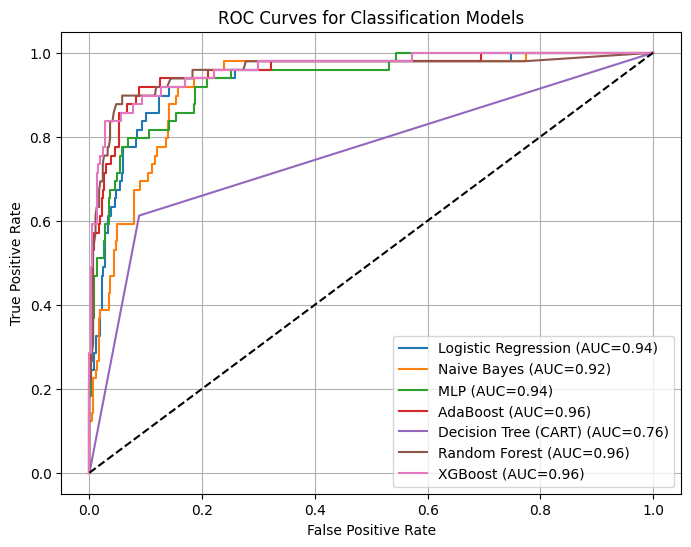


Generating Folium Map...



All models completed successfully.


In [45]:
# Refined NSU Challenge Notebook — Extended Version
# Added Models: Logistic Regression (LR), Naive Bayes (NB), MLP, AdaBoost, CART
# Keeps previous preprocessing, regression, classification, and visualization pipeline.

import os
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, classification_report, confusion_matrix, roc_auc_score, roc_curve

# Models
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
import xgboost as xgb

# Oversampling for imbalance
from imblearn.over_sampling import SMOTE

import folium

# -----------------------------------
# Data Loading
# -----------------------------------
DATA_PATH = '/content/2013-Now.csv'
CLASS_THRESH = 5.0
RANDOM_STATE = 42
TEST_SIZE = 0.2

print('Loading data...')
data = pd.read_csv(DATA_PATH, skiprows=1)
cols = ['time','latitude','longitude','depth','mag','magType','nst','gap','dmin','rms','net','id','updated','place','type','horizontalError','depthError','magError','magNst','status','locationSource','magSource']
data.columns = cols[:len(data.columns)]

data['time'] = pd.to_datetime(data['time'], errors='coerce')
data['hour'] = data['time'].dt.hour
data['day'] = data['time'].dt.day
data['month'] = data['time'].dt.month
data['year'] = data['time'].dt.year

data['is_strong'] = (data['mag'] >= CLASS_THRESH).astype(int)

numeric_features = ['latitude','longitude','depth','nst','gap','dmin','rms','horizontalError','depthError','magError','magNst','hour','day','month','year']
X = data[numeric_features].copy()
y_reg = data['mag']
y_cls = data['is_strong']

X_train, X_test, y_train_reg, y_test_reg = train_test_split(X, y_reg, test_size=TEST_SIZE, random_state=RANDOM_STATE)
y_train_cls = y_cls.loc[y_train_reg.index]
y_test_cls = y_cls.loc[y_test_reg.index]

# Preprocessing
num_transform = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])
preprocessor = ColumnTransformer([('num', num_transform, numeric_features)], remainder='drop')
preprocessor.fit(X_train)
X_train_prep = preprocessor.transform(X_train)
X_test_prep = preprocessor.transform(X_test)

# -----------------------------------
# Regression Models (LR, CART, RF, XGB)
# -----------------------------------
reg_models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree (CART)': DecisionTreeRegressor(random_state=RANDOM_STATE),
    'Random Forest': RandomForestRegressor(n_estimators=200, random_state=RANDOM_STATE, n_jobs=-1),
    'XGBoost': xgb.XGBRegressor(objective='reg:squarederror', n_estimators=200, learning_rate=0.1, random_state=RANDOM_STATE)
}

reg_results = []
for name, model in reg_models.items():
    model.fit(X_train_prep, y_train_reg)
    y_pred = model.predict(X_test_prep)
    mse = mean_squared_error(y_test_reg, y_pred)
    r2 = r2_score(y_test_reg, y_pred)
    reg_results.append({'Model': name, 'MSE': round(mse,3), 'R2': round(r2,3)})

reg_results_df = pd.DataFrame(reg_results)
print('\nRegression Model Results:\n', reg_results_df)

# -----------------------------------
# Classification Models (LR, NB, MLP, AdaBoost, CART, RF, XGB)
# -----------------------------------
smote = SMOTE(random_state=RANDOM_STATE)
X_train_bal, y_train_bal = smote.fit_resample(X_train_prep, y_train_cls)

cls_models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=RANDOM_STATE),
    'Naive Bayes': GaussianNB(),
    'MLP': MLPClassifier(hidden_layer_sizes=(64,32), activation='relu', solver='adam', max_iter=500, random_state=RANDOM_STATE),
    'AdaBoost': AdaBoostClassifier(n_estimators=200, random_state=RANDOM_STATE),
    'Decision Tree (CART)': DecisionTreeClassifier(random_state=RANDOM_STATE),
    'Random Forest': RandomForestClassifier(n_estimators=200, random_state=RANDOM_STATE, n_jobs=-1),
    'XGBoost': xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', n_estimators=200, random_state=RANDOM_STATE)
}

cls_results = []
for name, model in cls_models.items():
    model.fit(X_train_bal, y_train_bal)
    y_pred = model.predict(X_test_prep)
    y_proba = model.predict_proba(X_test_prep)[:,1] if hasattr(model, 'predict_proba') else np.zeros_like(y_pred)
    auc = roc_auc_score(y_test_cls, y_proba)
    report = classification_report(y_test_cls, y_pred, output_dict=True)
    acc = report['accuracy']
    cls_results.append({'Model': name, 'Accuracy': round(acc,3), 'ROC_AUC': round(auc,3)})
    print(f'\n{name} Results:\n', classification_report(y_test_cls, y_pred))

cls_results_df = pd.DataFrame(cls_results).sort_values(by='ROC_AUC', ascending=False)
print('\nClassification Model Results:\n', cls_results_df)

# ROC curves
plt.figure(figsize=(8,6))
for name, model in cls_models.items():
    if hasattr(model, 'predict_proba'):
        proba = model.predict_proba(X_test_prep)[:,1]
        fpr, tpr, _ = roc_curve(y_test_cls, proba)
        plt.plot(fpr, tpr, label=f"{name} (AUC={roc_auc_score(y_test_cls, proba):.2f})")
plt.plot([0,1],[0,1],'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Classification Models')
plt.legend()
plt.grid(True)
plt.show()

# -----------------------------------
# Geospatial Visualization
# -----------------------------------
if 'latitude' in data.columns and 'longitude' in data.columns:
    print('\nGenerating Folium Map...')
    m = folium.Map(location=[data['latitude'].mean(), data['longitude'].mean()], zoom_start=3)
    for _, row in data.head(3000).iterrows():
        popup = f"Magnitude: {row['mag']}<br>Depth: {row['depth']}<br>Time: {row['time']}"
        folium.CircleMarker(location=[row['latitude'], row['longitude']], radius=max(2,row['mag']/2), color='red', fill=True, fill_opacity=0.6, popup=popup).add_to(m)
    try:
        from IPython.display import display
        display(m)
    except Exception:
        m.save('earthquake_map.html')
        print('Map saved to earthquake_map.html')

print('\nAll models completed successfully.')


In [47]:
from sklearn.model_selection import cross_val_score, KFold

cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)
# Use the XGBoost Regressor model for cross-validation on the regression target
scores = cross_val_score(reg_models['XGBoost'], X_train_prep, y_train_reg, cv=cv, scoring='r2')
print("5-Fold CV R² mean:", np.mean(scores))

5-Fold CV R² mean: 0.667271356017686


Loading data...

5-Fold Cross Validation (Regression) Results:
                   Model  Mean R2  Std R2
0     Linear Regression    0.465   0.020
1  Decision Tree (CART)    0.423   0.080
2         Random Forest    0.701   0.028
3               XGBoost    0.645   0.024

5-Fold Cross Validation (Classification) Results:
                   Model  Mean ROC_AUC  Std ROC_AUC
6               XGBoost         0.997        0.002
5         Random Forest         0.997        0.001
2                   MLP         0.993        0.002
3              AdaBoost         0.978        0.001
0   Logistic Regression         0.948        0.002
1           Naive Bayes         0.929        0.007
4  Decision Tree (CART)         0.929        0.004


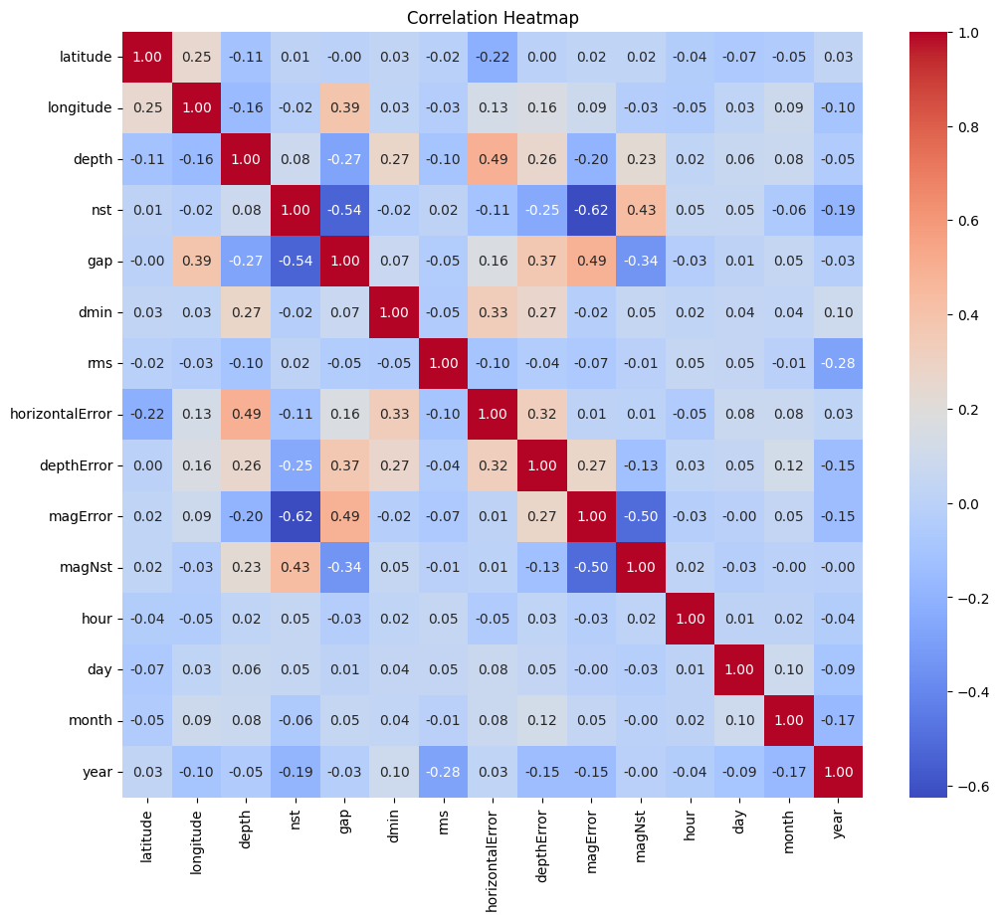

Creating Folium Map...



5-Fold CV evaluation complete. Ready for reporting.


In [48]:
# NSU Challenge — Cross-Validation (5-Fold) Version for Colab
# This version evaluates all models using 5-Fold Cross Validation

import os
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, classification_report, roc_auc_score, roc_curve

# Models
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
import xgboost as xgb

from imblearn.over_sampling import SMOTE
import folium

# -----------------------------------
# Data Loading
# -----------------------------------
DATA_PATH = '/content/2013-Now.csv'
CLASS_THRESH = 5.0
RANDOM_STATE = 42

print('Loading data...')
data = pd.read_csv(DATA_PATH, skiprows=1)
cols = ['time','latitude','longitude','depth','mag','magType','nst','gap','dmin','rms','net','id','updated','place','type','horizontalError','depthError','magError','magNst','status','locationSource','magSource']
data.columns = cols[:len(data.columns)]

data['time'] = pd.to_datetime(data['time'], errors='coerce')
data['hour'] = data['time'].dt.hour
data['day'] = data['time'].dt.day
data['month'] = data['time'].dt.month
data['year'] = data['time'].dt.year

data['is_strong'] = (data['mag'] >= CLASS_THRESH).astype(int)

numeric_features = ['latitude','longitude','depth','nst','gap','dmin','rms','horizontalError','depthError','magError','magNst','hour','day','month','year']
X = data[numeric_features].copy()
y_reg = data['mag']
y_cls = data['is_strong']

# Preprocessing
num_transform = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])
preprocessor = ColumnTransformer([('num', num_transform, numeric_features)], remainder='drop')
X_prep = preprocessor.fit_transform(X)

cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

# -----------------------------------
# Regression Models with 5-Fold CV
# -----------------------------------
reg_models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree (CART)': DecisionTreeRegressor(random_state=RANDOM_STATE),
    'Random Forest': RandomForestRegressor(n_estimators=200, random_state=RANDOM_STATE, n_jobs=-1),
    'XGBoost': xgb.XGBRegressor(objective='reg:squarederror', n_estimators=200, random_state=RANDOM_STATE)
}

reg_results = []
for name, model in reg_models.items():
    scores = cross_val_score(model, X_prep, y_reg, cv=cv, scoring='r2')
    reg_results.append({'Model': name, 'Mean R2': round(scores.mean(),3), 'Std R2': round(scores.std(),3)})

reg_results_df = pd.DataFrame(reg_results)
print('\n5-Fold Cross Validation (Regression) Results:\n', reg_results_df)

# -----------------------------------
# Classification Models with 5-Fold CV
# -----------------------------------
smote = SMOTE(random_state=RANDOM_STATE)
X_bal, y_bal = smote.fit_resample(X_prep, y_cls)

cls_models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=RANDOM_STATE),
    'Naive Bayes': GaussianNB(),
    'MLP': MLPClassifier(hidden_layer_sizes=(64,32), activation='relu', solver='adam', max_iter=500, random_state=RANDOM_STATE),
    'AdaBoost': AdaBoostClassifier(n_estimators=200, random_state=RANDOM_STATE),
    'Decision Tree (CART)': DecisionTreeClassifier(random_state=RANDOM_STATE),
    'Random Forest': RandomForestClassifier(n_estimators=200, random_state=RANDOM_STATE, n_jobs=-1),
    'XGBoost': xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', n_estimators=200, random_state=RANDOM_STATE)
}

cls_results = []
for name, model in cls_models.items():
    auc_scores = cross_val_score(model, X_bal, y_bal, cv=cv, scoring='roc_auc')
    cls_results.append({'Model': name, 'Mean ROC_AUC': round(auc_scores.mean(),3), 'Std ROC_AUC': round(auc_scores.std(),3)})

cls_results_df = pd.DataFrame(cls_results).sort_values(by='Mean ROC_AUC', ascending=False)
print('\n5-Fold Cross Validation (Classification) Results:\n', cls_results_df)

# -----------------------------------
# Correlation Heatmap & Geospatial Visualization
# -----------------------------------
plt.figure(figsize=(12,10))
sns.heatmap(data[numeric_features].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

if 'latitude' in data.columns and 'longitude' in data.columns:
    print('Creating Folium Map...')
    m = folium.Map(location=[data['latitude'].mean(), data['longitude'].mean()], zoom_start=2)
    for _, row in data.head(3000).iterrows():
        popup = f"Magnitude: {row['mag']}<br>Depth: {row['depth']}<br>Time: {row['time']}"
        folium.CircleMarker(location=[row['latitude'], row['longitude']], radius=max(2,row['mag']/2), color='red', fill=True, fill_opacity=0.6, popup=popup).add_to(m)
    try:
        from IPython.display import display
        display(m)
    except Exception:
        m.save('earthquake_map.html')
        print('Map saved to earthquake_map.html')

print('\n5-Fold CV evaluation complete. Ready for reporting.')
